# Importing

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random
import sklearn
from sklearn.datasets.samples_generator import make_blobs, make_moons
from collections import OrderedDict

In [2]:
import hdbscan

# Generating Dataset

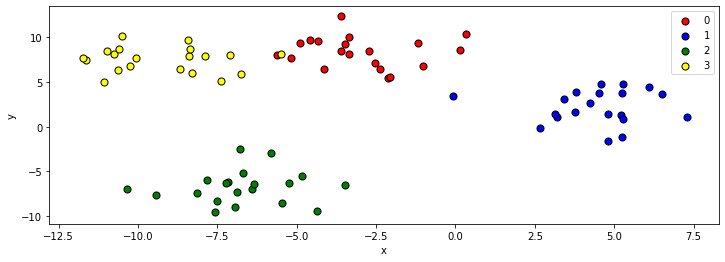

In [51]:
# generate 2d classification dataset
X, y = make_blobs(n_samples=80, centers=4, n_features=2, cluster_std=1.8, random_state=42)

# scatter plot, dots colored by class value
df = pd.DataFrame(dict(x=X[:,0], y=X[:,1], label=y))
colors = {0:'red', 1:'blue', 2:'green', 3:'yellow'}
fig, ax = plt.subplots(figsize=(12,4))
grouped = df.groupby('label')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='x', y='y', label=key, color=colors[key], s=50, edgecolor="black")
plt.show()

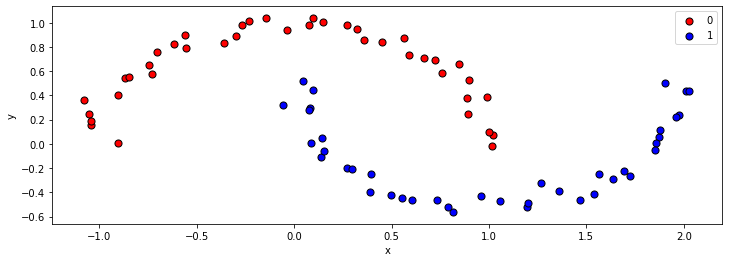

In [53]:
# generate 2d classification dataset
X, y = make_moons(n_samples=80, noise=0.05, random_state=42)

# scatter plot, dots colored by class value
df = pd.DataFrame(dict(x=X[:,0], y=X[:,1], label=y))
colors = {0:'red', 1:'blue', 2:'green', 3:'yellow'}
fig, ax = plt.subplots(figsize=(12,4))
grouped = df.groupby('label')
for key, group in grouped:
    group.plot(ax=ax, kind='scatter', x='x', y='y', label=key, color=colors[key], s=50, edgecolor="black")
plt.show()

# OPTICS

Cluster analysis method based on the OPTICS algorithm. OPTICS computes an augmented cluster-ordering of the database objects. The main advantage of our approach, when compared to the clustering algorithms proposed in the literature, is that we do not limit ourselves to one global parameter setting. Instead, the augmented cluster-ordering contains information which is equivalent to the density-based clusterings corresponding to a broad range of parameter settings and thus is a versatile basis for both automatic and interactive cluster analysis.

## Functions

In [5]:
def point_plot(X_dict, x,y, eps, processed=None, col='yellow'):
    
    fig, ax = plt.subplots(figsize=(14,6))
    
    plt.scatter(X[:,0], X[:,1], s=300, color="lime", edgecolor="black")
    
    if processed is not None:
        for i in processed:
            plt.scatter(X_dict[i][0],X_dict[i][1], color=col, s=300 )
    
    plt.scatter(x=x,y=y,s=400, color="black", alpha=0.4)
    
    circle1 = plt.Circle((x, y), eps, color='r', fill=False, linewidth=3, alpha=0.7)
    plt.gcf().gca().add_artist(circle1)
    
    xmin, xmax, ymin, ymax = plt.axis()
    xwidth = xmax - xmin
    ywidth = ymax - ymin
    
    xw1 = xwidth*0.008
    yw1 = ywidth*0.01
    
    xw2 = xwidth*0.005
    yw2 = ywidth*0.01

    for i, txt in enumerate([i for i in range(len(X))]):
        if len(str(txt))==2:
            ax.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=12, size=12)
        else:
            ax.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=12, size=12)
    
    plt.show()

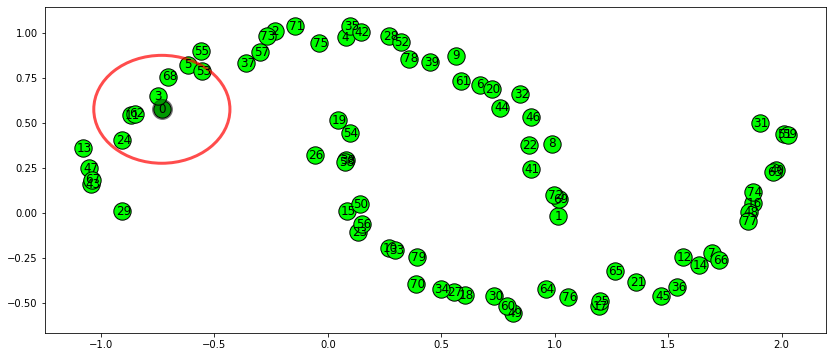

In [108]:
point_plot(dict(zip([str(i) for i in range(len(X))], X)), X[0,0], X[0,1], eps=0.3)

In [7]:
# original euclidean distance
def dist1(x,y):   
    return np.sqrt(np.sum((x-y)**2))

In [8]:
# euclidean distance which takes keys of a dictionary (X_dict) as inputs
def dist2(data, x,y):   
    return np.sqrt(np.sum((data[x]-data[y])**2))

In [9]:
# neighborhood search for a point of a given dataset-dictionary (data) with a fixed eps
def scan_neigh1(data, point, eps):
    
    neigh = {}
    distances = {}
    
    for i, element in enumerate(data.values()):
        
        d = dist1(element, point)
        
        if (d <= eps) and (d != 0):
            
            neigh.update({str(i):element})

    return neigh   


In [10]:
# variation that returns only the keys of the input dictionary with the euclidean distances <= eps from the point
def scan_neigh2(data, point, eps):
    
    neigh = {}
    distances = {}
    
    for i, element in enumerate(data.values()):
        
        d = dist1(element, point)
        
        if (d <= eps) and (d != 0):
            
            distances.update({str(i):d})

    d_sorted = sorted(distances.items(), key=lambda x: x[1], reverse=False)

    return d_sorted

In [11]:
# returns the minPTS-distance of a point if it is a core point, else it return np.inf
def minPTSdist(data, o, minPTS, eps):
    
    S = scan_neigh2(data, data[o], eps)
    
    if len(S) >= minPTS-1:
        
        return S[minPTS-2][1]
    
    else:
        
        return np.inf    

In [12]:
#reachability distance (even if it is not a distance because it isn't symmetrical)
def reach_dist(data, x,y, minPTS, eps):
    
    return max(dist2(data, x,y), minPTSdist(data, y, minPTS, eps))

In [71]:
# plots the reachability plot, along with a horizontal line denoting eps, from the ClustDist produced by OPTICS
def Reach_plot(data, ClustDist, eps):
    plot_dic = {}

    for key, value in ClustDist.items():
        
        if np.isinf(value) == True:
            
            plot_dic[key] = eps*1.15
        
        else:
            
            plot_dic[key] = ClustDist[key]
        
    missing_keys = list(set(data.keys())-set(ClustDist.keys()))
    
    tick_list = list(ClustDist.keys()) + [' ']*(len(missing_keys))

    for m_k in missing_keys:

        plot_dic[m_k] = 0
        
    fig, ax = plt.subplots(1, 1, figsize=(12,5))
    
    ax.bar(plot_dic.keys(),plot_dic.values())
    
    ax.set_xticks(tick_list)
    
    ax.axhline(eps, color="red", linewidth=3)
    
    ax1 = ax.twinx()
    ax1.set_ylim(ax.get_ylim())
    ax1.set_yticks([eps])
    ax1.set_yticklabels(["\u03B5"])
    
    #plt.annotate("\u03B5", (0.92,0.79), xycoords='figure fraction')

    plt.show()

In [14]:
def OPTICS(X, eps, minPTS, plot=True, plot_reach=False):
    
    ClustDist = {}
    CoreDist = {}
    Seed =  {}
    processed = []
    
    # create dictionary
    X_dict = dict(zip([str(i) for i in range(len(X))], X))

    while len(processed) != len(X):

        if len(Seed) == 0:

                unprocessed = list(set(list(X_dict.keys())) - set(processed))

                (o, r) = (random.choice(unprocessed), np.inf)

        else:

            (o, r) = (min(Seed, key=Seed.get), Seed[min(Seed, key=Seed.get)])

            del Seed[o]

        N = scan_neigh1(X_dict, X_dict[o], eps)

        ClustDist.update({o:r})
        
        CoreDist.update({o: minPTSdist(X_dict, o, minPTS, eps)})
        
        if plot == True:
            
            point_plot(X_dict, X_dict[o][0], X_dict[o][1], eps, processed)
            
            if plot_reach == True:
                
                Reach_plot(X_dict, ClustDist, eps)
        

        processed.append(o)

        if len(N) >= minPTS-1 :

            for n in N:

                if n in processed:

                    continue

                else:

                    p = reach_dist(X_dict, n, o, minPTS, eps)

                    if n in Seed:

                        if p < Seed[n]:

                            Seed[n] = p
                    else:

                        Seed.update({n:p})
    
    return (ClustDist, CoreDist)

In [15]:
#extracts cluster in a DBSCAN fashion; one can use any eps_db <= eps of OPTICS
def ExtractDBSCANclust(ClustDist, CoreDist, eps_db):
    
    Clust_Dict = {}
    
    noise = -1
    
    clust_id = -1
    
    for key, value in ClustDist.items():
        
        if value > eps_db:
            
            if CoreDist[key] <= eps_db:
                
                clust_id += 1
                
                Clust_Dict[key] = clust_id
                
            else:
                
                Clust_Dict[key] = noise
                
        else:
            
            Clust_Dict[key] = clust_id
    
    return Clust_Dict

In [79]:
def plot_clust(X, ClustDist, CoreDist, eps, eps_db):
    
    X_dict = dict(zip([str(i) for i in range(len(X))], X))

    cl = ExtractDBSCANclust(ClustDist, CoreDist, eps_db)

    new_dict = {key: (val1, cl[key]) for key,val1 in zip(list(X_dict.keys()),list(X_dict.values())) }

    new_dict = OrderedDict((k, new_dict[k]) for k in list(ClustDist.keys()))

    df = pd.DataFrame(dict(x = [i[0][0] for i in list(new_dict.values())], 
                 y=[i[0][1] for i in list(new_dict.values())], 
                 label= [i[1]for i in list(new_dict.values())]), index=new_dict.keys())

    colors = {-1:'red', 0:'lightblue', 1:'beige', 2:'yellow', 3:'grey', 
              4:'pink', 5:'navy', 6:'orange', 7:'purple', 8:'salmon', 9:'olive', 10:'brown',
             11:'tan', 12: 'lime'}

    #fig, ax = plt.subplots(figsize=(14,6))
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18,6))
    
    grouped = df.groupby('label')
    for key, group in grouped:
        group.plot(ax=ax1, kind='scatter', x='x', y='y', label=key, color=colors[key], s=300, edgecolor="black")

    ax1.set_xlabel("")
    ax1.set_ylabel("")
    
    xmin, xmax, ymin, ymax = ax1.axis()
    xwidth = xmax - xmin
    ywidth = ymax - ymin

    xw1 = xwidth*0.01
    yw1 = ywidth*0.01
    
    xw2 = xwidth*0.003
    yw2 = ywidth*0.01

    for i, txt in enumerate([i for i in range(len(X))]):
        if len(str(txt))==2:
            ax1.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=8, size=10)
        else:
            ax1.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=8, size=10)


    #plt.show()

    plot_dic = {}

    for key, value in ClustDist.items():

        if np.isinf(value) == True:

            plot_dic[key] = eps*1.15

        else:

            plot_dic[key] = ClustDist[key]

    #plt.figure(figsize=(8,5), ax=ax)
    #fig, ax = plt.subplots(figsize=(8,5))
    ax2.bar(plot_dic.keys(),plot_dic.values(), color=[colors[i] for i in df.label], edgecolor="black")

    ax2.axhline(eps, color="black", linewidth=3)

    #plt.annotate("\u03B5", (0.920,0.79), xycoords='figure fraction')

    ax2.axhline(eps_db, color="black", linewidth=3)

    #plt.annotate("\u03B5"+"\'", (438,eps_db*103), xycoords='axes points')
    
    ax3 = ax2.twinx()
    ax3.set_ylim(ax2.get_ylim())
    ax3.set_yticks([eps, eps_db])
    ax3.set_yticklabels(["\u03B5", "\u03B5"+"\'"])

    plt.show()

## Testing

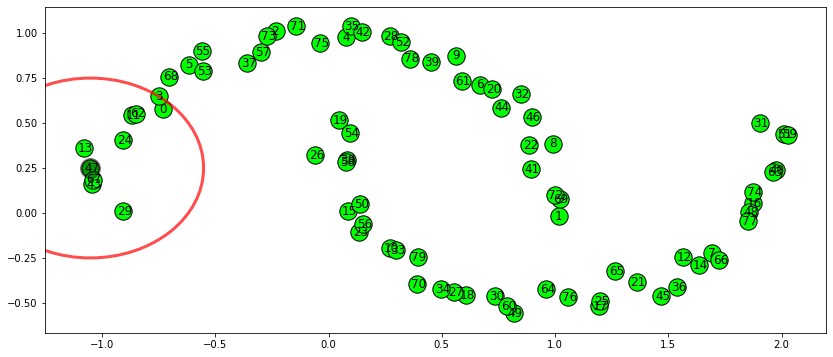

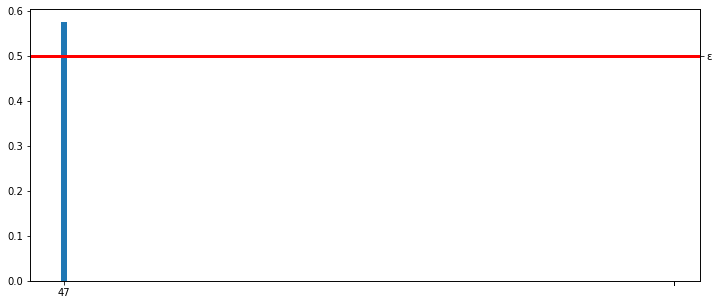

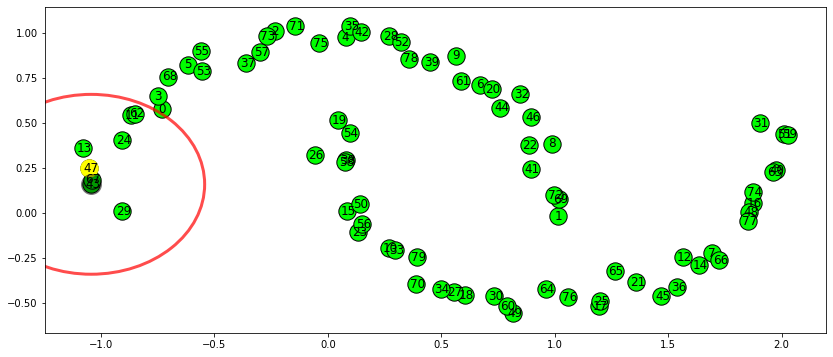

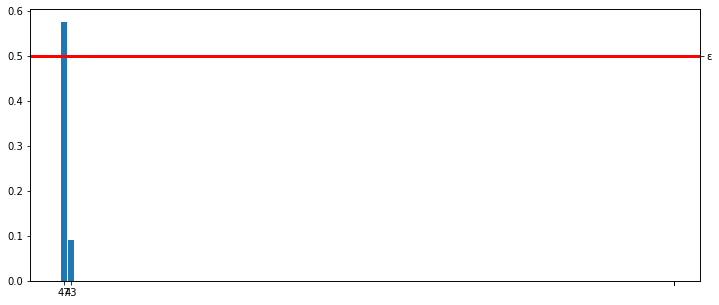

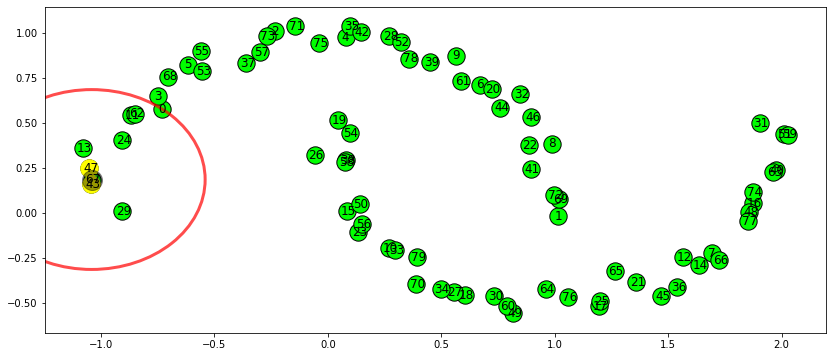

...

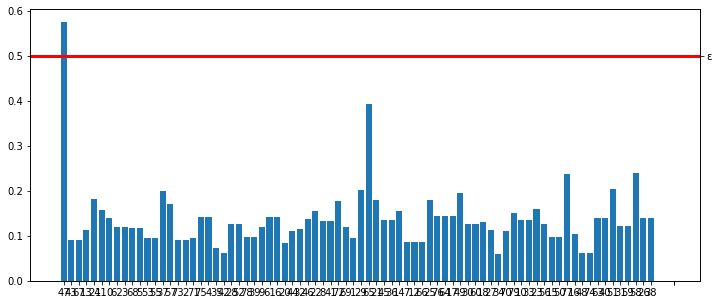

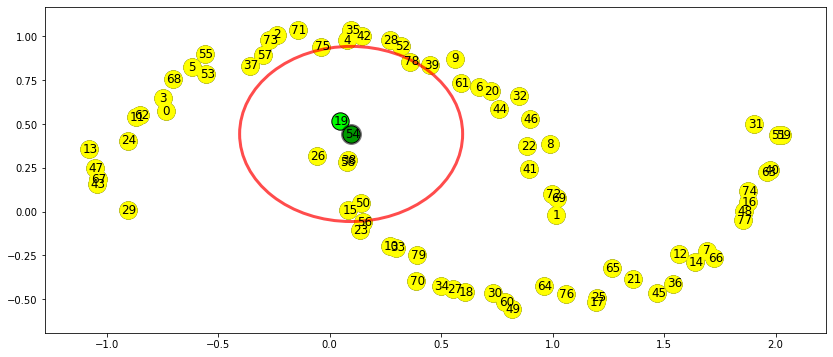

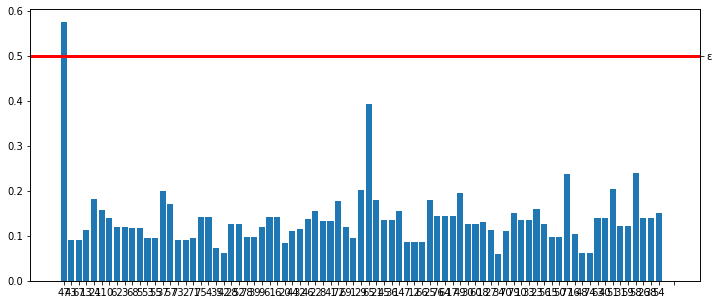

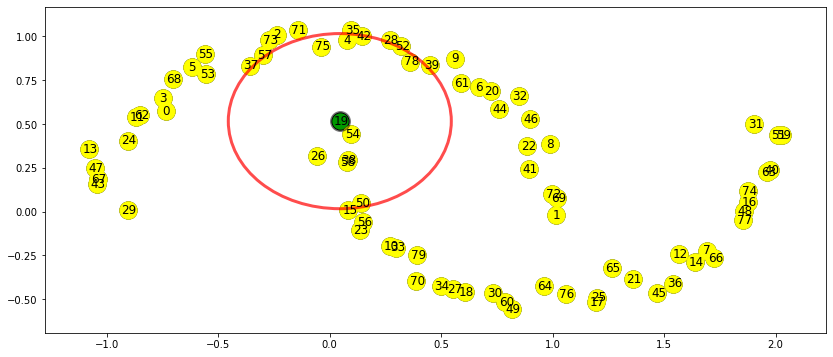

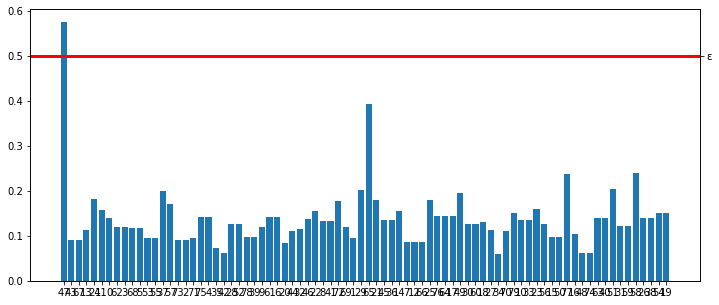

In [72]:
ClustDist, CoreDist = OPTICS(X, eps=0.5, minPTS=3, plot=True, plot_reach=True)

In [73]:
ClustDist, CoreDist = OPTICS(X, eps=0.5, minPTS=3, plot=False, plot_reach=False)

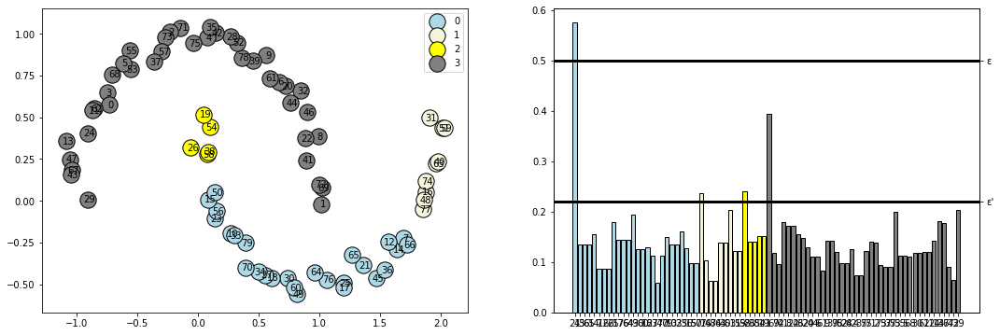

In [80]:
plot_clust(X, ClustDist, CoreDist, eps=0.5, eps_db=0.22)

# DBSCAN

ADVANTAGES:

DBSCAN does not require one to specify the number of clusters in the data a priori, as opposed to k-means.

DBSCAN can find arbitrarily shaped clusters. It can even find a cluster completely surrounded by (but not connected to) a different cluster. Due to the MinPts parameter, the so-called single-link effect (different clusters being connected by a thin line of points) is reduced.

DBSCAN has a notion of noise, and is robust to outliers.

DBSCAN requires just two parameters and is mostly insensitive to the ordering of the points in the database. (However, points sitting on the edge of two different clusters might swap cluster membership if the ordering of the points is changed, and the cluster assignment is unique only up to isomorphism.)

DBSCAN is designed for use with databases that can accelerate region queries, e.g. using an R* tree.

The parameters minPts and ε can be set by a domain expert, if the data is well understood.

DISADVANTAGES:

DBSCAN is not entirely deterministic: border points that are reachable from more than one cluster can be part of either cluster, depending on the order the data are processed. For most data sets and domains, this situation does not arise often and has little impact on the clustering result: both on core points and noise points, DBSCAN is deterministic. DBSCAN* is a variation that treats border points as noise, and this way achieves a fully deterministic result as well as a more consistent statistical interpretation of density-connected components.

The quality of DBSCAN depends on the distance measure used in the function regionQuery(P,ε). The most common distance metric used is Euclidean distance. Especially for high-dimensional data, this metric can be rendered almost useless due to the so-called "Curse of dimensionality", making it difficult to find an appropriate value for ε. This effect, however, is also present in any other algorithm based on Euclidean distance.

DBSCAN cannot cluster data sets well with large differences in densities, since the minPts-ε combination cannot then be chosen appropriately for all clusters.

If the data and scale are not well understood, choosing a meaningful distance threshold ε can be difficult.

## Functions

In [31]:
# modification that takes also the point itself into account
def scan_neigh1_mod(data, point, eps):
    
    neigh = {}
    distances = {}
    
    for i, element in enumerate(data.values()):
        
        d = dist1(element, point)
        
        if (d <= eps):
            
            neigh.update({str(i):element})

    return neigh   

In [21]:
def point_plot_mod(X_dict, x,y, eps, ClustDict, clust_id):
    
    colors = {-1:'red', 0:'lightblue', 1:'beige', 2:'yellow', 3:'grey', 
              4:'pink', 5:'navy', 6:'orange', 7:'purple', 8:'salmon', 9:'olive', 10:'brown',
             11:'tan', 12: 'lime'}
    
    fig, ax = plt.subplots(figsize=(14,6))
    
    plt.scatter(X[:,0], X[:,1], s=300, color="lime", edgecolor="black")
    
    for i in ClustDict:
        plt.scatter(X_dict[i][0],X_dict[i][1], color=colors[ClustDict[i]], s=300 )
    
    plt.scatter(x=x,y=y,s=400, color="black", alpha=0.4)
    
    circle1 = plt.Circle((x, y), eps, color='r', fill=False, linewidth=3, alpha=0.7)
    plt.gcf().gca().add_artist(circle1)
    
    xmin, xmax, ymin, ymax = plt.axis()
    xwidth = xmax - xmin
    ywidth = ymax - ymin
    
    xw1 = xwidth*0.008
    yw1 = ywidth*0.01
    
    xw2 = xwidth*0.005
    yw2 = ywidth*0.01

    for i, txt in enumerate([i for i in range(len(X))]):
        if len(str(txt))==2:
            ax.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=12, size=12)
        else:
            ax.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=12, size=12)
    
    plt.show()

In [22]:
def plot_clust_DB(X, ClustDict, eps, circle_class=None, Noise_circle=True):

    X_dict = dict(zip([str(i) for i in range(len(X))], X))

    new_dict = {key: (val1, ClustDict[key]) for key,val1 in zip(list(X_dict.keys()),list(X_dict.values())) }

    new_dict = OrderedDict((k, new_dict[k]) for k in list(ClustDict.keys()))

    df = pd.DataFrame(dict(x = [i[0][0] for i in list(new_dict.values())], 
                 y=[i[0][1] for i in list(new_dict.values())], 
                 label= [i[1]for i in list(new_dict.values())]), index=new_dict.keys())

    colors = {-1:'red', 0:'lightblue', 1:'beige', 2:'yellow', 3:'grey', 
              4:'pink', 5:'navy', 6:'orange', 7:'purple', 8:'salmon', 9:'olive', 10:'brown',
             11:'tan', 12: 'lime'}

    #fig, ax = plt.subplots(figsize=(14,6))
    fig, ax1 = plt.subplots(1, 1, figsize=(18,6))

    grouped = df.groupby('label')

        #for key, group in grouped:

            #group.plot(ax=ax1, kind='scatter', x='x', y='y', label=key, color=colors[key], s=300, edgecolor="black")

    lista_lab = list(df.label.value_counts().index)
    
    for lab in lista_lab:

        df_sub = df[df.label == lab]
        plt.scatter(df_sub.x, df_sub.y, color = colors[lab], s=300, edgecolor="black")

    if Noise_circle == True:

        df_noise = df[df.label == -1]

        for i in range(len(df_noise)):
            
            ax1.add_artist(plt.Circle((df_noise["x"].iloc[i], 
                                       df_noise["y"].iloc[i]), eps, color='r', fill=False, linewidth=3, alpha=0.7))
            
    if circle_class is not None:
        
        if circle_class != "true":
            
            lista_lab = circle_class
        
        for lab in lista_lab:
        
            if lab != -1:
                
                df_temp = df[df.label == lab]
                
                for i in range(len(df_temp)):
            
                    ax1.add_artist(plt.Circle((df_temp["x"].iloc[i], df_temp["y"].iloc[i]), 
                                              eps, color=colors[lab], fill=False, linewidth=3, alpha=0.7))
                
    ax1.set_xlabel("")
    ax1.set_ylabel("")
    
    
    xmin, xmax, ymin, ymax = plt.axis()
    xwidth = xmax - xmin
    ywidth = ymax - ymin
    
    xw1 = xwidth*0.005
    yw1 = ywidth*0.01
    
    xw2 = xwidth*0.0025
    yw2 = ywidth*0.01

    for i, txt in enumerate([i for i in range(len(X))]):
        if len(str(txt))==2:
            ax1.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=8, size=10)
        else:
            ax1.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=8, size=10)


    plt.show()

In [60]:
def DBSCAN(data, eps, minPTS, plotting=False, print_details=False):
        
    ClustDict = {}

    clust_id = -1

    X_dict = dict(zip([str(i) for i in range(len(X))], X))

    processed = []

    processed_list = []

    #unprocessed = list(set(list(X_dict.keys())) - set(processed))

    for point in X_dict:

        if point not in processed:

            processed.append(point)

            #print(processed)

            N = scan_neigh1_mod(X_dict, X_dict[point], eps)
            
            if print_details == True:
                
                print("len(N): ", len(N))

            if len(N) < minPTS:

                ClustDict.update({point: -1})
                
                if plotting == True:
                    
                    point_plot_mod(X_dict, X_dict[point][0], X_dict[point][1], eps, ClustDict, -1)

            else:

                clust_id+=1

                ClustDict.update({point: clust_id})
                
                if plotting == True:
                
                    point_plot_mod(X_dict, X_dict[point][0], X_dict[point][1], eps, ClustDict, clust_id)

                processed_list = [point]
                
                del N[point]

                while len(N)>0:
                    
                    if print_details == True:
                    
                        print("len(N) in while loop: ", len(N))

                    n = random.choice(list(N.keys()))

                    while (n in processed_list):

                        n = random.choice(list(N.keys()))

                    processed_list.append(n)

                    del N[n]

                    if n not in processed:

                        processed.append(n)

                        N_2 = scan_neigh1_mod(X_dict, X_dict[n], eps)
                        
                        if print_details == True:
                        
                            print("len N2: ", len(N_2))

                        if len(N_2) >= minPTS:

                            for element in N_2:

                                if element not in processed_list:

                                    N.update({element: X_dict[element]})

                    if (n not in ClustDict) or (ClustDict[n] == -1):

                        ClustDict.update({n: clust_id})
                    
                    if plotting == True:
                            
                            point_plot_mod(X_dict, X_dict[n][0], X_dict[n][1], eps, ClustDict, clust_id)
                            
    return ClustDict

## Testing

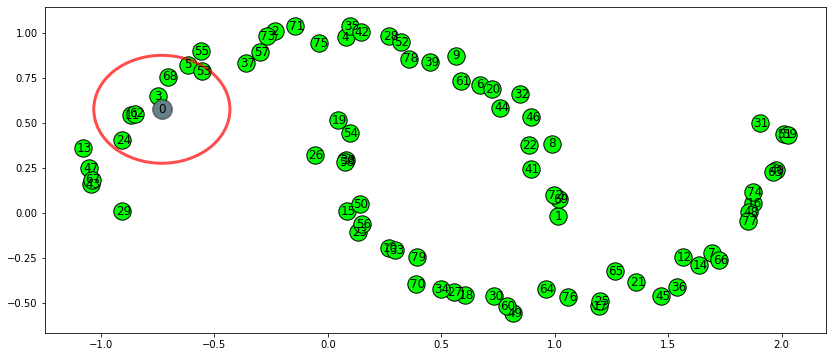

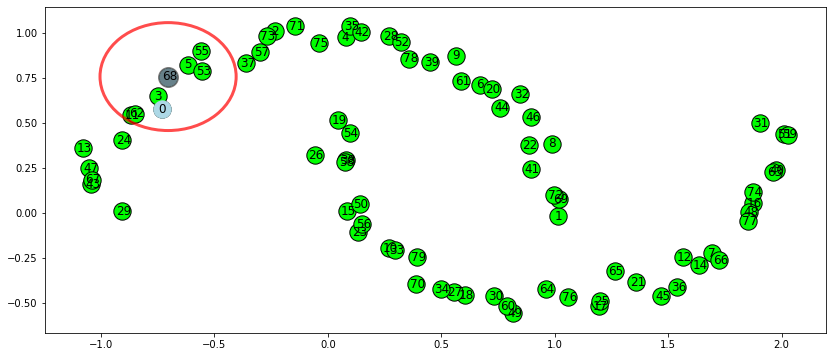

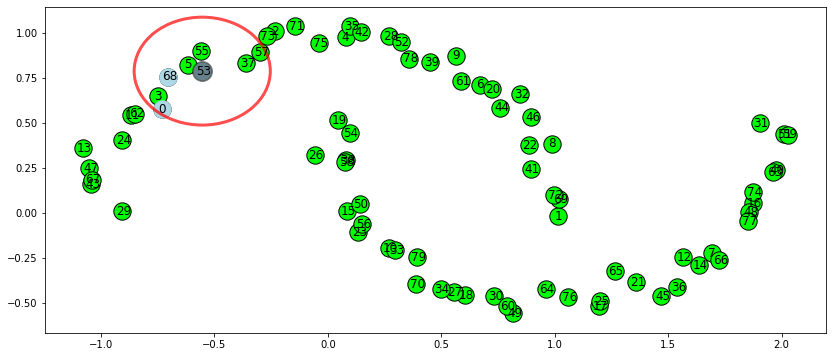

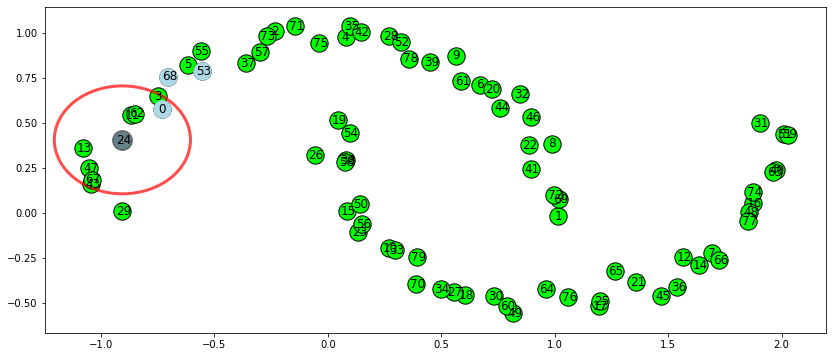

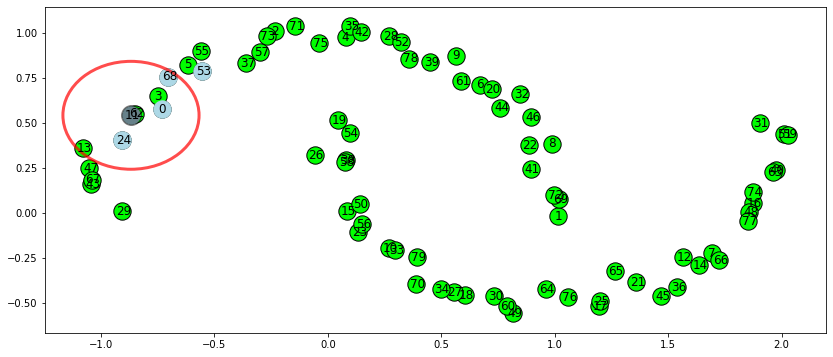

...

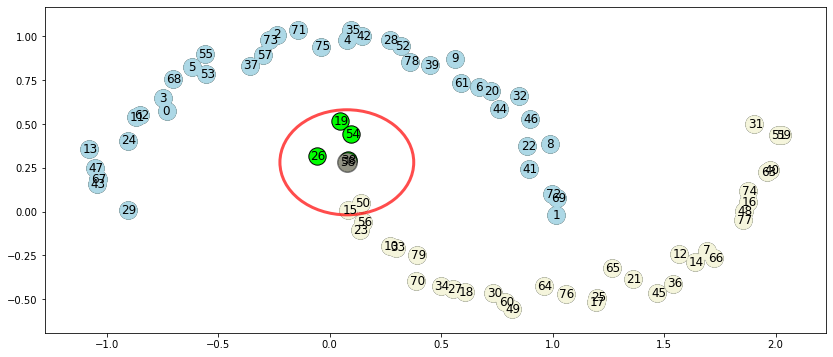

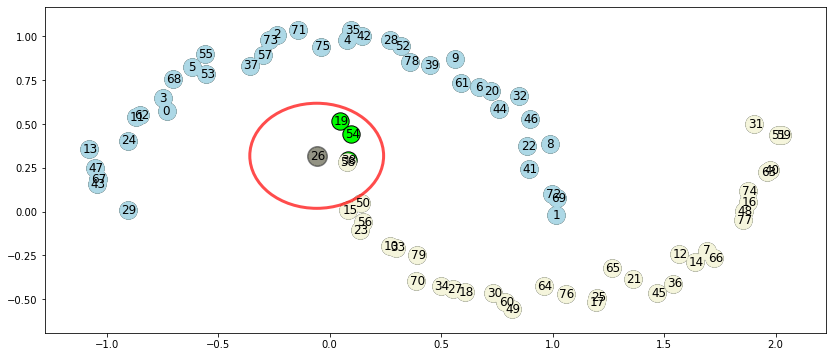

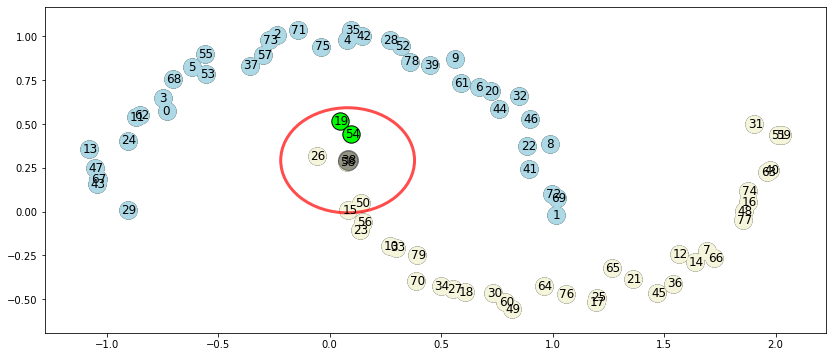

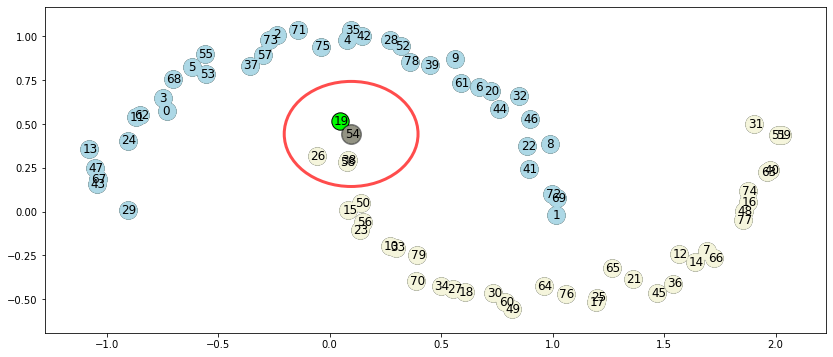

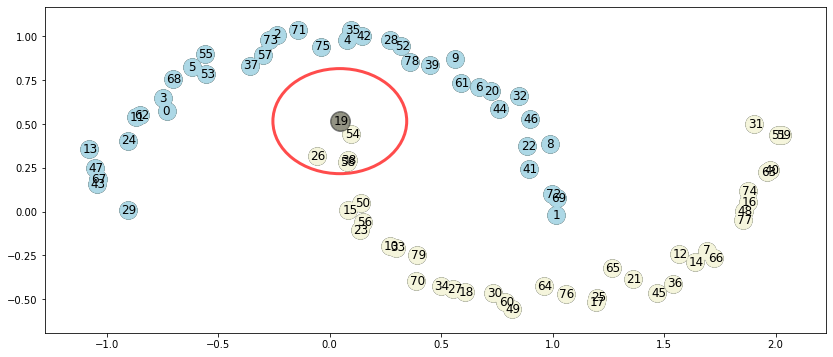

In [61]:
ClustDict = DBSCAN(X, eps=0.3, minPTS=3, plotting=True)

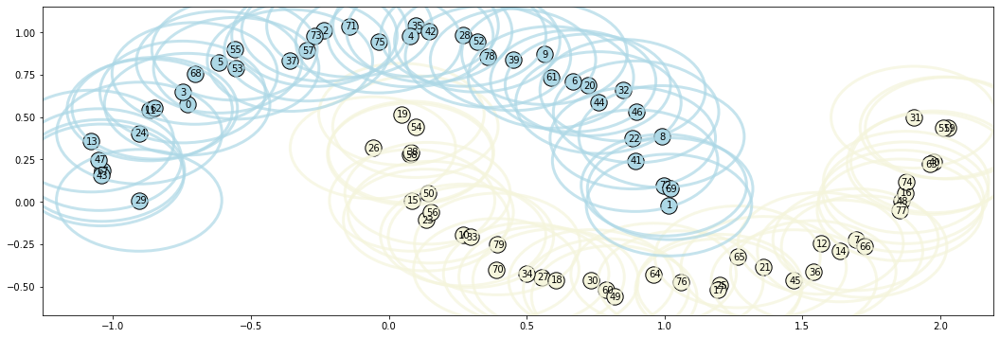

In [64]:
plot_clust_DB(X, ClustDict, eps=0.3, Noise_circle=True, circle_class="true")

# HDBSCAN

https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html 

Density-based clustering is a popular clustering paradigm. However, the existing methods have a number of limitations: 

(i) Some methods (e.g., DBSCAN and DENCLUE ) can only provide a “flat” (i.e. non-hierarchical) labeling of the data objects, based on a global density threshold. Using a single density threshold can often not properly characterize common data sets with clusters of very different densities and/or nested clusters. 

(ii) Among the methods that provide a clustering hierarchy, some (e.g., gSkeletonClu) are not able to automatically simplify the hierarchy into an easily interpretable representation involving only the most significant clusters. 

(iii) Many hierarchical methods, including OPTICS and gSkeletonClu, suggest only how to extract a flat partition by using a global cut/density threshold, which may not result in the most significant clusters if these clusters are characterized by different density levels. 

(iv) Some methods are limited to specific classes of problems, such as networks (gSkeletonClu), and point sets in the real coordinate space (e.g., DECODE, and Generalized Single-Linkage). 

(v) Most methods depend on multiple, often critical input parameters.

In this paper, we propose a clustering approach that, to the best of our knowledge, is unique in that it does not suffer from any of these drawbacks. 
In detail, we make the following contributions: 

(i) We introduce a hierarchical clustering method, called HDBSCAN, which generates a complete density-based clustering hierarchy from which a simplified hierarchy composed only of the most significant clusters can be easily extracted. 

(ii) We propose a new measure of cluster stability for the purpose of extracting a set of significant clusters from possibly different levels of a simplified cluster tree produced by HDBSCAN. 

(iii) We formulate the task of extracting a set of significant clusters as an optimization problem in which the overall stability of the composing clusters is maximized. 

(iv) We propose an algorithm that finds the globally optimal solution to this problem. 

(v) We demonstrate the advancement in density-based clustering that our approach represents on a variety of real world data sets.

In [246]:
# by default min_samples is set equal to min_cluster_size
clusterer = hdbscan.HDBSCAN(min_cluster_size=3, gen_min_span_tree=True)
clusterer.fit(X)

HDBSCAN(algorithm='best', allow_single_cluster=False, alpha=1.0,
        approx_min_span_tree=True, cluster_selection_method='eom',
        core_dist_n_jobs=4, gen_min_span_tree=True, leaf_size=40,
        match_reference_implementation=False, memory=Memory(location=None),
        metric='euclidean', min_cluster_size=3, min_samples=None, p=None,
        prediction_data=False)

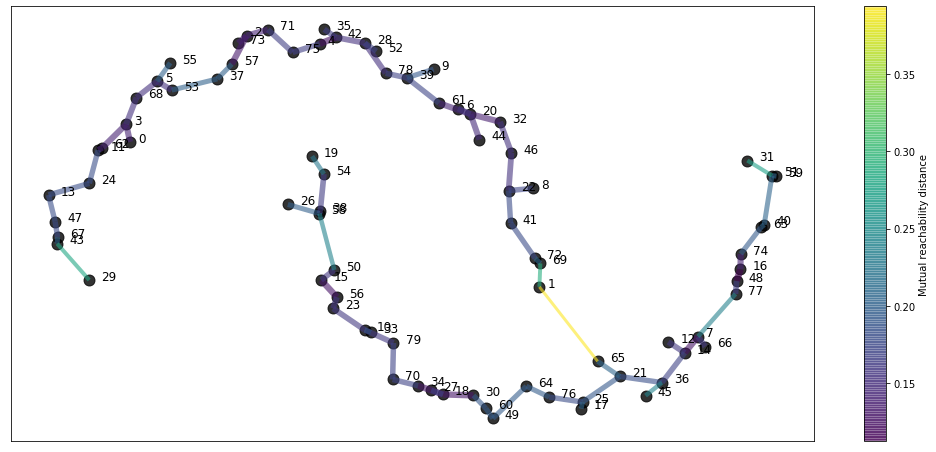

In [247]:
plt.figure(figsize = (18,8))
clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      node_size=120,
                                      edge_linewidth=3,
                                      )

xmin, xmax, ymin, ymax = plt.axis()
xwidth = xmax - xmin
ywidth = ymax - ymin

xw1 = xwidth*0.015
yw1 = ywidth*0

xw2 = xwidth*0.01
yw2 = ywidth*0

for i, txt in enumerate([i for i in range(len(X))]):
    if len(str(txt))==2:
        plt.annotate(txt, (X[:,0][i]+xw1, X[:,1][i]-yw1), fontsize=12, size=12)
    else:
        plt.annotate(txt, (X[:,0][i]+xw2, X[:,1][i]-yw2), fontsize=12, size=12)


plt.show()

In [248]:
# distances in detail
dist_df = clusterer.minimum_spanning_tree_.to_pandas()
dist_df = dist_df.sort_values("distance", ascending=False)
dist_df
#they are processed in this order in the dendrogram below, starting from the whole data 
#and finishing with the single points
# in case of a tie in distances the splits must be executed simultaneously (as in 69 and 68 in the dist_df)

,from,to,distance
78,1,65,0.393793
77,1,69,0.289347
76,29,43,0.280570
75,31,51,0.272799
74,45,36,0.240618
73,58,50,0.239736
72,77,7,0.237301
71,19,54,0.226311
70,69,72,0.208951
69,17,25,0.206537


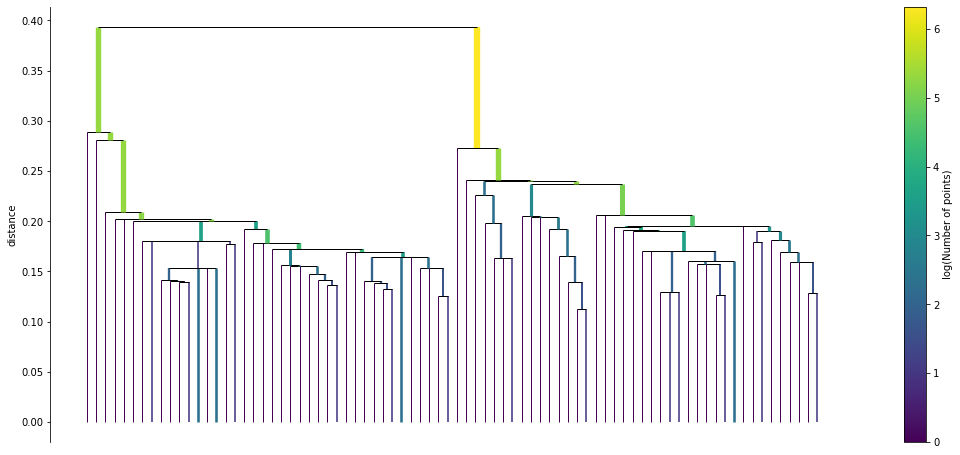

In [249]:
#the scale is in log2, it proceeds from the top to the bottom
plt.figure(figsize = (18,8))
clusterer.single_linkage_tree_.plot(cmap='viridis', colorbar=True)
plt.show()

In [250]:
#Each row of the dataframe corresponds to an edge in the tree. 
#The parent and child are the ids of the parent and child nodes in the tree. 
#Node ids less than the number of points in the original dataset represent individual points, 
#while ids greater than the number of points are clusters.

#The lambda_val value is the value (1/distance) at which the child node
#leaves the cluster (1/distance of previous dataframe)

#The child_size is the number of points in the child node.

clusterer.condensed_tree_.to_pandas()

,parent,child,lambda_val,child_size
0,80,81,2.539408,40
1,80,82,2.539408,40
2,81,1,3.456058,1
3,82,31,3.665699,1
4,81,29,3.564171,1
5,82,45,4.155962,1
6,81,69,4.785802,1
7,82,83,4.171248,5
8,82,84,4.171248,33
9,81,43,4.935623,1


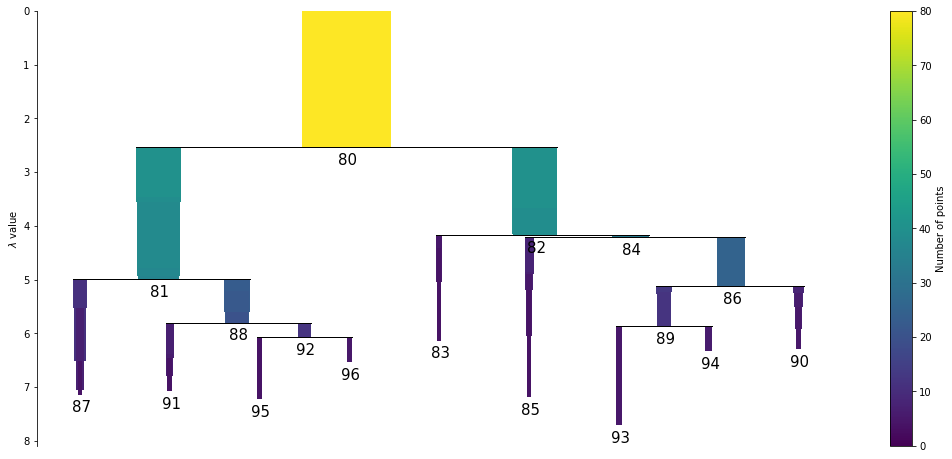

In [251]:
plt.figure(figsize = (18,8))
clusterer.condensed_tree_.plot()
clust_data = clusterer.condensed_tree_.get_plot_data()["cluster_bounds"]

xmin, xmax, ymin, ymax = plt.axis()
xwidth = xmax - xmin
ywidth = ymax - ymin

for name in list(clust_data.keys()):
    data = clust_data[name]
    x = (data[0] + data[1])/2 -xwidth*0.01
    y = (data[3])-ywidth*0.04
    plt.annotate("{0}".format(name), (x,y), fontsize=15, size=15)

plt.show()

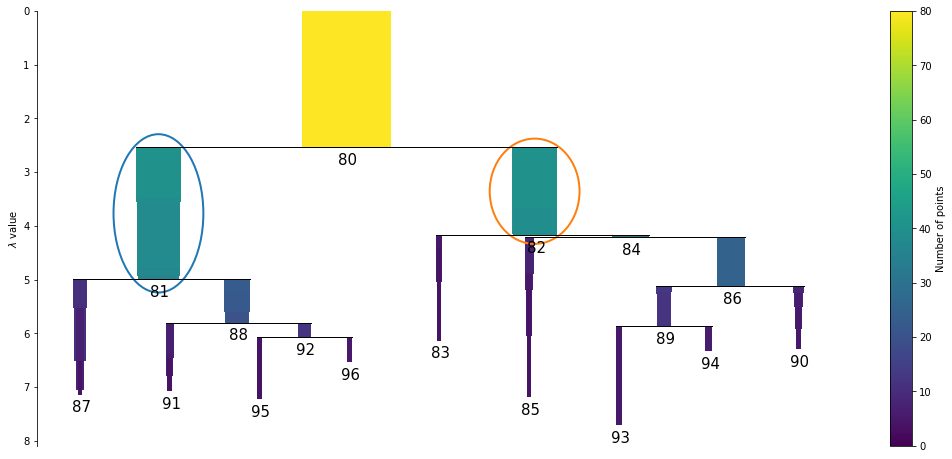

In [252]:
plt.figure(figsize = (18,8))
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())
clust_data = clusterer.condensed_tree_.get_plot_data()["cluster_bounds"]

xmin, xmax, ymin, ymax = plt.axis()
xwidth = xmax - xmin
ywidth = ymax - ymin

for name in list(clust_data.keys()):
    data = clust_data[name]
    x = (data[0] + data[1])/2 -xwidth*0.01
    y = (data[3])-ywidth*0.04
    plt.annotate("{0}".format(name), (x,y), fontsize=15, size=15)
plt.show()

In [253]:
clusterer.labels_

array([0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1])

In [254]:
clusterer.probabilities_

array([1.        , 0.69202497, 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 0.71367288,
       1.        , 0.87880148, 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 0.98828609, 1.        ,
       0.99633539, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       0.98911138, 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ,
       1.        , 1.        , 1.        , 1.        , 0.95828653,
       1.        , 1.        , 1.        , 1.        , 1.     

In [255]:
clusterer.outlier_scores_

array([0.        , 0.30797503, 0.        , 0.        , 0.        ,
       0.08751985, 0.09792493, 0.        , 0.00042554, 0.10258069,
       0.01628621, 0.01165863, 0.        , 0.22452201, 0.        ,
       0.        , 0.        , 0.05501784, 0.        , 0.27953871,
       0.        , 0.12593446, 0.08740995, 0.        , 0.22452201,
       0.16649243, 0.17822144, 0.23930397, 0.        , 0.28632712,
       0.        , 0.12119852, 0.        , 0.10211366, 0.        ,
       0.        , 0.05897422, 0.30040755, 0.        , 0.02809664,
       0.31803512, 0.0336328 , 0.        , 0.01171391, 0.03829863,
       0.00366461, 0.08740995, 0.22452201, 0.        , 0.12340874,
       0.        , 0.31803512, 0.02809664, 0.08751985, 0.        ,
       0.01088862, 0.        , 0.        , 0.        , 0.32324277,
       0.10940768, 0.        , 0.        , 0.2779721 , 0.18579366,
       0.05501784, 0.        , 0.22452201, 0.08751985, 0.04171347,
       0.23930397, 0.01808899, 0.0336328 , 0.        , 0.     

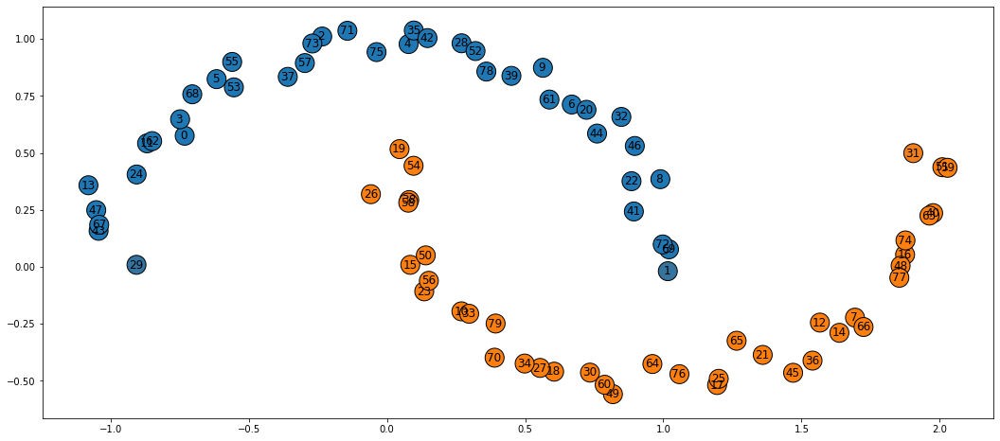

In [256]:
plt.figure(figsize=(18,8))
palette = sns.color_palette()
cluster_colors = [sns.desaturate(palette[col], sat)
                  if col >= 0 else (0.5, 0.5, 0.5) for col, sat in
                  zip(clusterer.labels_, clusterer.probabilities_)]
plt.scatter(X.T[0], X.T[1], c=cluster_colors, s=400, edgecolor="black")

xmin, xmax, ymin, ymax = plt.axis()
xwidth = xmax - xmin
ywidth = ymax - ymin

xw1 = xwidth*0.008
yw1 = ywidth*0.008

xw2 = xwidth*0.005
yw2 = ywidth*0.008

for i, txt in enumerate([i for i in range(len(X))]):
    if len(str(txt))==2:
        plt.annotate(txt, (X[:,0][i]-xw1, X[:,1][i]-yw1), fontsize=12, size=12)
    else:
        plt.annotate(txt, (X[:,0][i]-xw2, X[:,1][i]-yw2), fontsize=12, size=12)


plt.show()